# Workflow1 - extract ensemble of conformations from MD simulation that summarize interesting states of the simulation

### Importing the libraries

In [1]:
import mdtraj as md
import numpy as np
import pyemma
import nglview
import matplotlib.pyplot as plt
import itertools
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist, pdist
from math import sqrt
import wget
import sys
import os
from datetime import date
from subprocess import call
from mpl_toolkits.mplot3d import Axes3D 
import glob
from pathlib import Path
from Bio.PDB.PDBParser import PDBParser
from nglview.player import TrajectoryPlayer
from threading import Timer
import pandas as pd
from utils import *

_ColormakerRegistry()

### Importing trajectories and reference PDB file

In [2]:
#specify locations of the trajectory file and the topology file of system of interest
traj_file="./ExampleTraj.xtc"
top_file = "./ExampleProt.pdb"

In [3]:
#visualize the structure of interest
widget = nglview.show_mdtraj(md.load(top_file))
p = TrajectoryPlayer(widget)
#widget.add_ball_and_stick()
widget

NGLWidget()

### Choosing the features to represent the system

Not all atoms are of interest across the simulation. In this step we extract the most relevant features for the simulation.

#### Identify the residues of interest from a csv file

The user can provide a CSV file with the residues of interest (part of the structure that you want to observe)

Csv file format should be:

chain, residue_id

In [4]:
#name of the file with residues specified or None
residue_csv = "cdr_residues.csv"

if not residue_csv == None:
    res_df = pd.read_csv(residue_csv)
    res_ind = extract_res_ind(top_file, res_df)
    print("Indexes of residues of interest:")
    print(res_ind)
else:
    print("All residues are of interest:")
    parser = PDBParser(PERMISSIVE=1)
    structure = parser.get_structure("struct", top_file)
    res_ind = [i for i, elem in enumerate(structure.get_residues())]


Indexes of residues of interest:
[26, 27, 28, 29, 30, 31, 49, 50, 51, 52, 53, 54, 55, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 222, 223, 224, 225, 226, 244, 245, 246, 247, 248, 249, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297]


#### Possible features of interest:

1. pairwise AA distances (min distance) (aadist)
2. torsion angles (tangle)
3. ...

In [5]:
#specify which features you want to explore

features = ["aadist", "tangle", "tangle+aadist"]
featurizers = []

def feat_options(featurizer, option, res_ind):
    pairs = list(itertools.combinations(res_ind, 2))
    selstring = "resid "+str(res_ind[0])
    for ind in res_ind[1:]:
        selstring+=" or resid "+str(ind)
    if option == "aadist": return featurizer.add_residue_mindist(residue_pairs=np.array(pairs), scheme='closest-heavy')
    if option == "tangle": 
        return featurizer.add_backbone_torsions(selstring, cossin=True, periodic=False)

for feature in features:
    feature = feature.split("+")
    pyMfeat = pyemma.coordinates.featurizer(top_file)
    for f in feature:
        feat_options(pyMfeat, f, res_ind)
    featurizers.append(pyMfeat)


In [6]:
#apply featurizers
data = []

for f in featurizers:
    data+=pyemma.coordinates.source(traj_file, features=f)

#### Identify the features with the greatest contribution to the dynamic processes with VAMP2-score

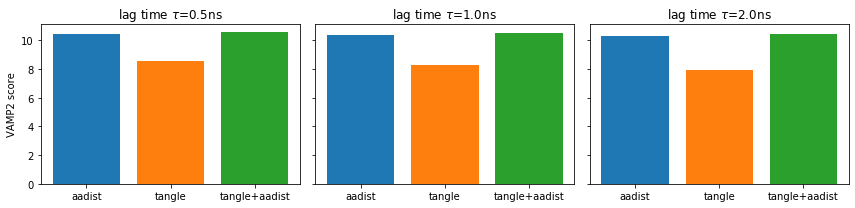

In [7]:
def score_cv(data, dim, lag, number_of_splits=10, validation_fraction=0.5):
    """Compute a cross-validated VAMP2 score.

    We randomly split the list of independent trajectories into
    a training and a validation set, compute the VAMP2 score,
    and repeat this process several times.

    Parameters
    ----------
    data : list of numpy.ndarrays
        The input data.
    dim : int
        Number of processes to score; equivalent to the dimension
        after projecting the data with VAMP2.
    lag : int
        Lag time for the VAMP2 scoring.
    number_of_splits : int, optional, default=10
        How often do we repeat the splitting and score calculation.
    validation_fraction : int, optional, default=0.5
        Fraction of trajectories which should go into the validation
        set during a split.
    """
    vamp = pyemma.coordinates.vamp(data, lag=lag, dim=dim)
    scores = vamp.score(data)
    return scores


dim = 10

fig, axes = plt.subplots(1, 3, figsize=(12, 3), sharey=True)

for ax, lag in zip(axes.flat, [5, 10, 20]):
    scores = []
    errors = []
    for d in data:
        sc = score_cv(d[1], lag=lag, dim=dim)
        scores += [sc.mean()]
        errors += [sc.std()]
      
    ax.bar(features, scores, color=['C0', 'C1', 'C2'])
    ax.set_title(r'lag time $\tau$={:.1f}ns'.format(lag * 0.1))
    if lag == 5:
        # save for later
        vamp_bars_plot = dict(
            labels=features, scores=scores, errors=errors, dim=dim, lag=lag)
axes[0].set_ylabel('VAMP2 score')
fig.tight_layout()

#### Choose a feature with highest VAMP2-score to proceed
And see how the dimensionality of VAMP2 affects the score

In [8]:
chosen_feature = "tangle+aadist"
d = data[features.index(chosen_feature)]
featurizer = featurizers[features.index(chosen_feature)]
print(d)

(0, array([[-0.46218616, -0.88678294, -0.54974693, ...,  0.13449506,
         0.43792838,  0.13538477],
       [-0.61307395, -0.79002553, -0.59517646, ...,  0.13484797,
         0.44347042,  0.13366748],
       [-0.44199523, -0.8970174 , -0.55118304, ...,  0.13446184,
         0.43407112,  0.13503349],
       ...,
       [-0.59988946, -0.8000829 , -0.8131957 , ...,  0.13400714,
         0.3477399 ,  0.13468839],
       [-0.26452106, -0.9643799 , -0.77266747, ...,  0.13507386,
         0.34228224,  0.1352368 ],
       [-0.598019  , -0.8014819 , -0.6890783 , ...,  0.13455114,
         0.36669865,  0.13461779]], dtype=float32))


### PCA - reduce dimensionality of input features

In [26]:
Y = d[1]

[(37251, 120)]
(37251, 120)


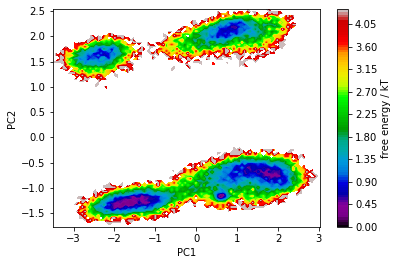

In [27]:
pca_obj = pyemma.coordinates.pca(Y)
pca_y = pca_obj.get_output()
print([yi.shape for yi in pca_y])

Y_concat = np.concatenate(pca_y, axis=0)
print(Y_concat.shape)

pyemma.plots.plot_free_energy(Y_concat[:,0], Y_concat[:,1], cbar=True)

plt.xlabel("PC1")
plt.ylabel("PC2")
plt.savefig("pca_free-energy.png")

In [28]:
# Plot PC1, PC2, PC3
import plotly.express as px

fig = px.scatter_3d(x=pca_y[0][:,0], y=pca_y[0][:,1], z=pca_y[0][:,2])
fig.update_traces(marker=dict(size=1,
                              line=dict(width=0.5,
                                        color='DarkSlateGrey')),
                  selector=dict(mode='markers'))
fig.show()

Total of 50.757093964813194% of variance explaned by first 6 PCs.


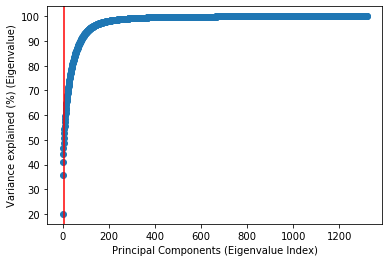

In [29]:
# How much variance do you want explained?
variance_explained = 50 

pca_eigenvalues = pca_obj.eigenvalues
variance = np.cumsum(pca_eigenvalues)/np.sum(pca_eigenvalues) * 100
pca_num = 0
for i, v in enumerate(variance):
    if v >= variance_explained:
        pca_num = i
        break
plt.scatter(np.arange(len(pca_eigenvalues)), variance)
plt.axvline(pca_num, color='red')
plt.xlabel("Principal Components (Eigenvalue Index)")
plt.ylabel("Variance explained (%) (Eigenvalue)")
plt.savefig("pca_ev.png")

print("Total of "+str(v)+"% of variance explaned by first "+str(pca_num)+" PCs.")

In [30]:
Y.shape

(37251, 1320)

Representative components of PC0
['RES_DIST (closest-heavy) ARG56 - GLY29'
 'RES_DIST (closest-heavy) TYR54 - GLY29'
 'RES_DIST (closest-heavy) VAL51 - GLN55'
 'RES_DIST (closest-heavy) TYR54 - HIS30'
 'RES_DIST (closest-heavy) TYR54 - SER28']
Corresponding influence of these features to the given PC
[0.88268623 0.88437798 0.89077429 0.90940945 0.9154108 ]


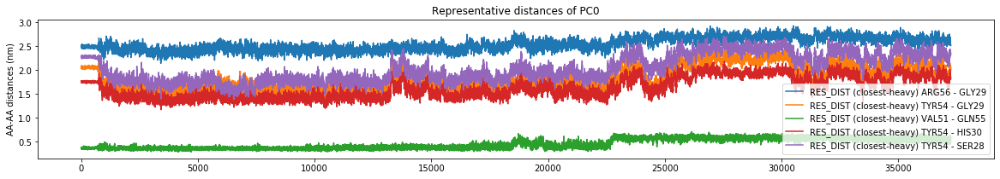

Representative components of PC1
['RES_DIST (closest-heavy) GLY96 - GLY99'
 'RES_DIST (closest-heavy) ALA92 - ALA98'
 'RES_DIST (closest-heavy) ALA98 - VAL104' 'COS(PSI 0 ALA 98)'
 'SIN(PHI 0 GLY 99)']
Corresponding influence of these features to the given PC
[0.81340274 0.82426831 0.86053416 0.97410216 0.9765235 ]


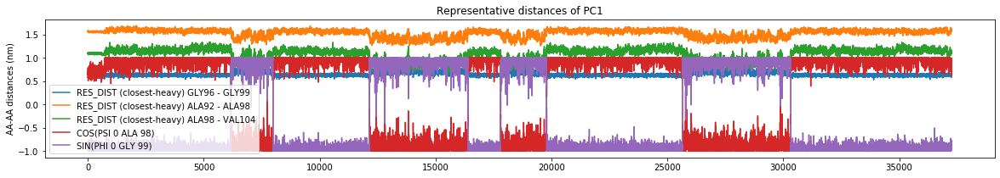

Representative components of PC2
['RES_DIST (closest-heavy) TYR54 - PHE51'
 'RES_DIST (closest-heavy) TYR54 - SER32'
 'RES_DIST (closest-heavy) TYR54 - GLU53'
 'RES_DIST (closest-heavy) TYR54 - MET98'
 'RES_DIST (closest-heavy) TYR54 - SER52']
Corresponding influence of these features to the given PC
[0.61687632 0.61933723 0.6325041  0.64309082 0.64330273]


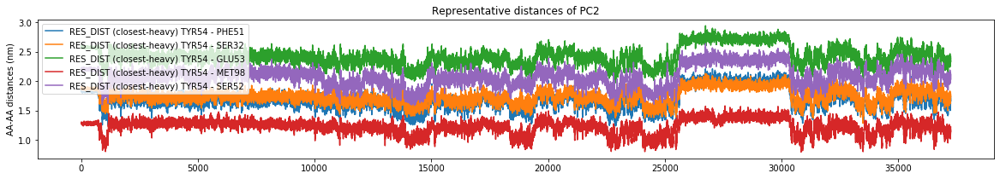

Representative components of PC3
['RES_DIST (closest-heavy) ALA30 - ASN97'
 'RES_DIST (closest-heavy) ALA30 - MET98'
 'RES_DIST (closest-heavy) ALA30 - PHE96'
 'RES_DIST (closest-heavy) ALA30 - GLY29' 'COS(PSI 0 ALA 30)']
Corresponding influence of these features to the given PC
[0.50905508 0.52622529 0.5378008  0.54935428 0.62223944]


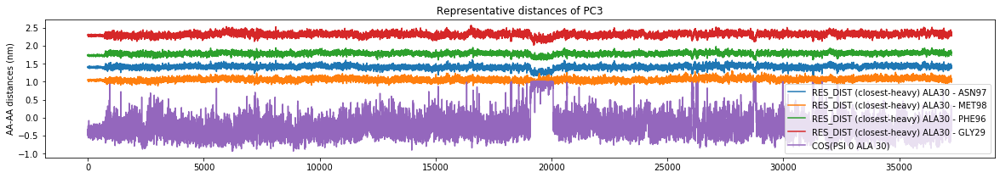

Representative components of PC4
['RES_DIST (closest-heavy) TYR54 - GLY96'
 'RES_DIST (closest-heavy) ARG94 - HIS30'
 'RES_DIST (closest-heavy) TYR54 - GLY97'
 'RES_DIST (closest-heavy) TYR54 - ALA98'
 'RES_DIST (closest-heavy) ARG94 - PHE96']
Corresponding influence of these features to the given PC
[0.46821889 0.47154615 0.4733944  0.47603742 0.49798611]


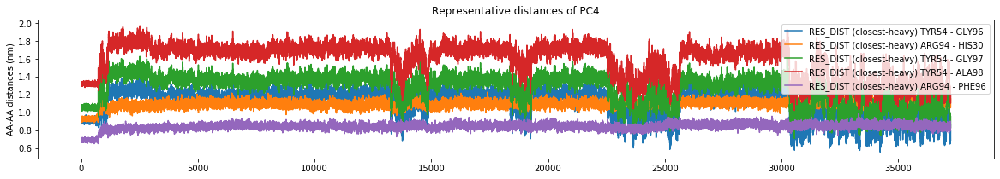

Representative components of PC5
['RES_DIST (closest-heavy) PRO95 - SER28'
 'RES_DIST (closest-heavy) GLY97 - SER28'
 'RES_DIST (closest-heavy) GLY96 - SER28' 'COS(PSI 1 SER 28)'
 'SIN(PHI 1 SER 28)']
Corresponding influence of these features to the given PC
[0.42540845 0.45517063 0.47234979 0.48741467 0.59486914]


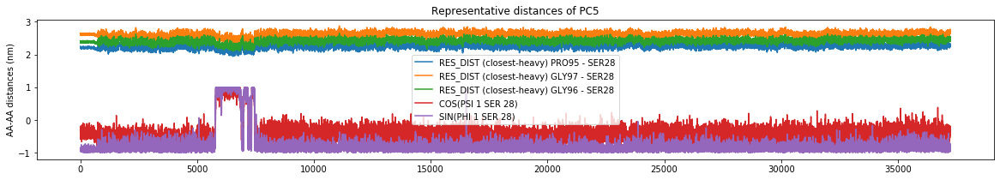

In [31]:
%matplotlib inline

# Which 5 features are most correlated with a PCA component?
num_feats = 5
feat_des = np.array(featurizer.describe())
pca_corr = pca_obj.feature_PC_correlation

plt.rcParams["figure.figsize"] = (20,3)
for i in range(pca_num):
    print("Representative components of PC"+str(i))
    TIC_i = abs(pca_corr)[:, i]
    sorted_ind_i = np.argsort(TIC_i)
    print(feat_des[sorted_ind_i][-num_feats:])
    print("Corresponding influence of these features to the given PC")
    print(TIC_i[sorted_ind_i][-num_feats:])
    for j, elem in enumerate(sorted_ind_i[-num_feats:]):
        plt.plot(np.arange(len(Y)), Y[:,elem], label=feat_des[sorted_ind_i][-num_feats+j])
    
    plt.ylabel( "AA-AA distances (nm)")
    title="Representative distances of PC"+str(i)
    plt.title(title)
    plt.gca().legend()
    plt.show()

## Cluster with k-means (scikit learn) over the first k number of PCAs
With Elbow method and silhouette analysis

In [32]:
Y_concat = np.concatenate(pca_y, axis=0)
print(Y_concat.shape)

X = np.concatenate([yi[:,:9] for yi in pca_y], axis=0)
print(X.shape)
#print(dt_trans[:,5])

(37251, 120)
(37251, 9)


Clustering with k=1
Clustering with k=2
Clustering with k=3
Clustering with k=4
Clustering with k=5
Clustering with k=6
Clustering with k=7
Clustering with k=8
Clustering with k=9
Clustering with k=10
Clustering with k=11
Clustering with k=12
Clustering with k=13
Clustering with k=14
Clustering with k=15
Clustering with k=16
Clustering with k=17
Clustering with k=18
Clustering with k=19


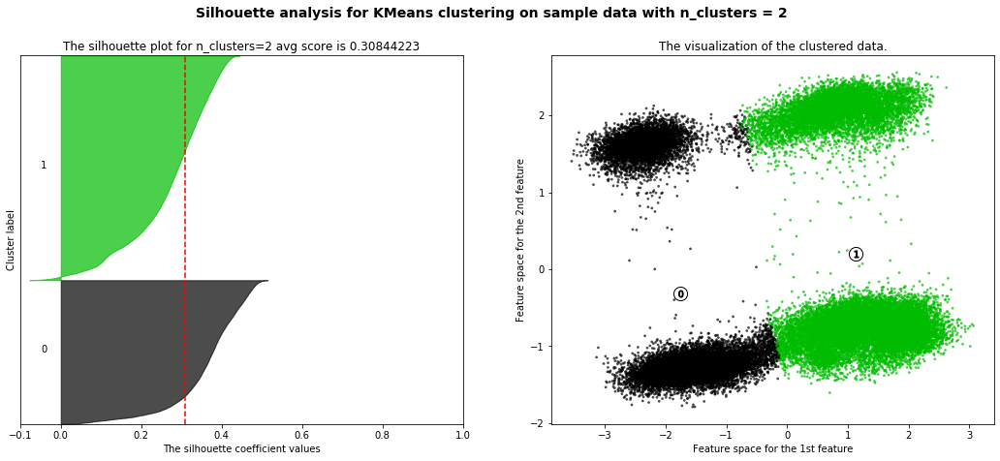

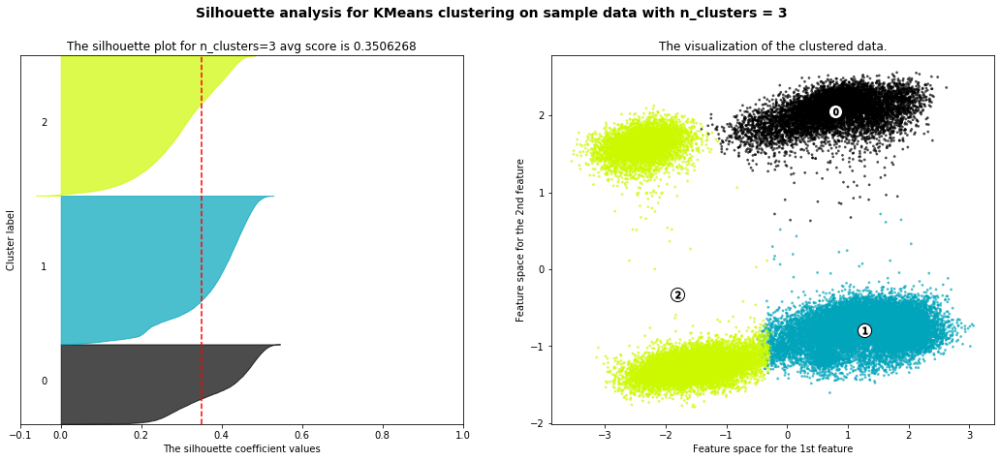

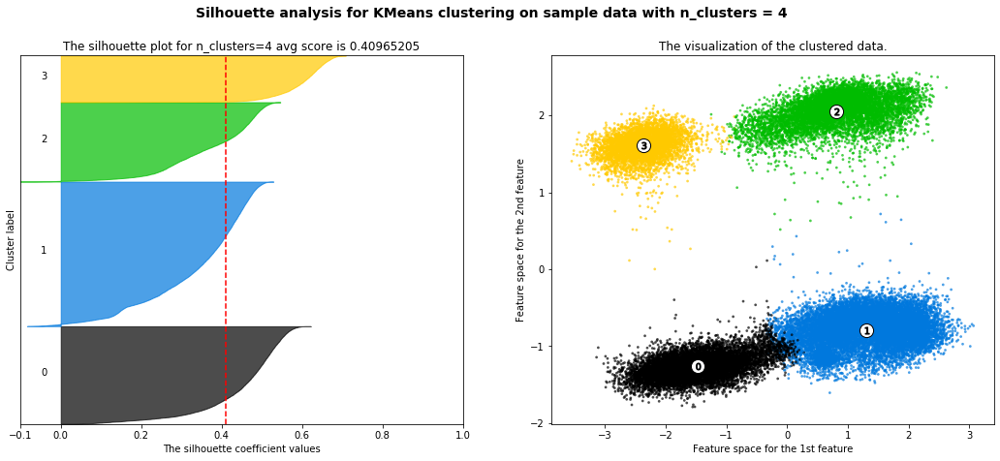

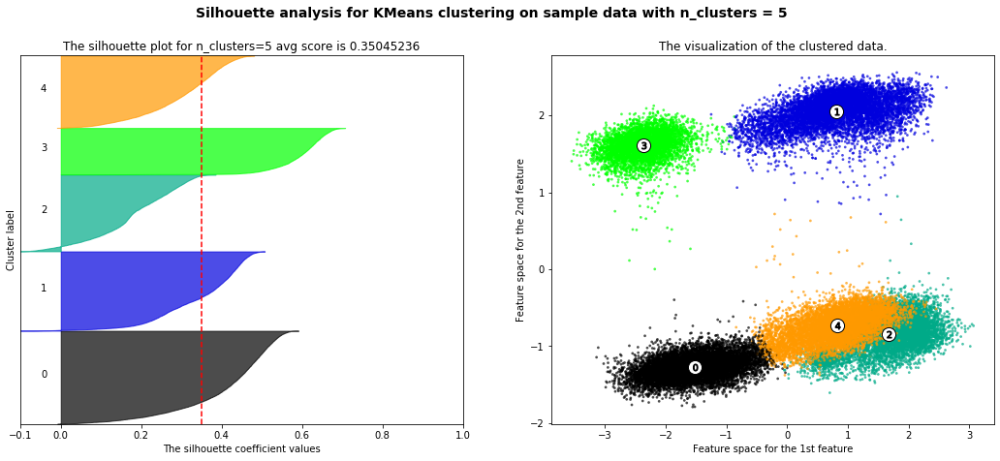

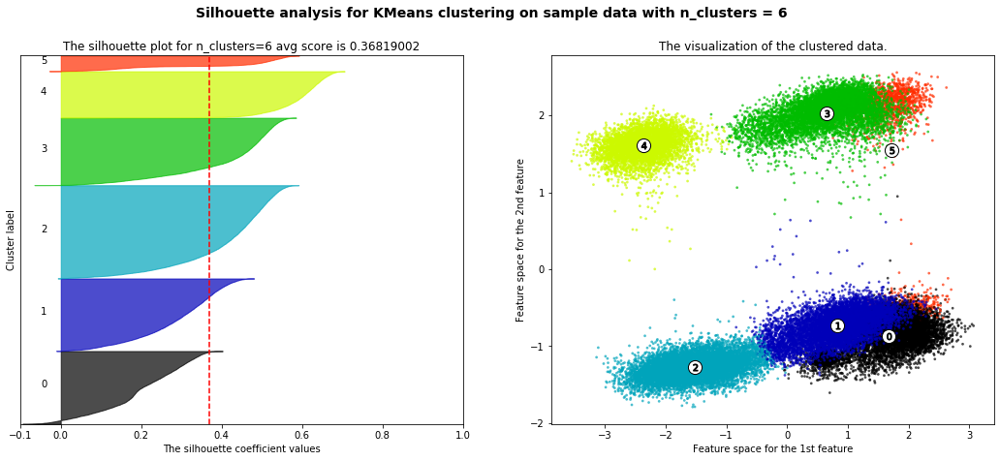

...

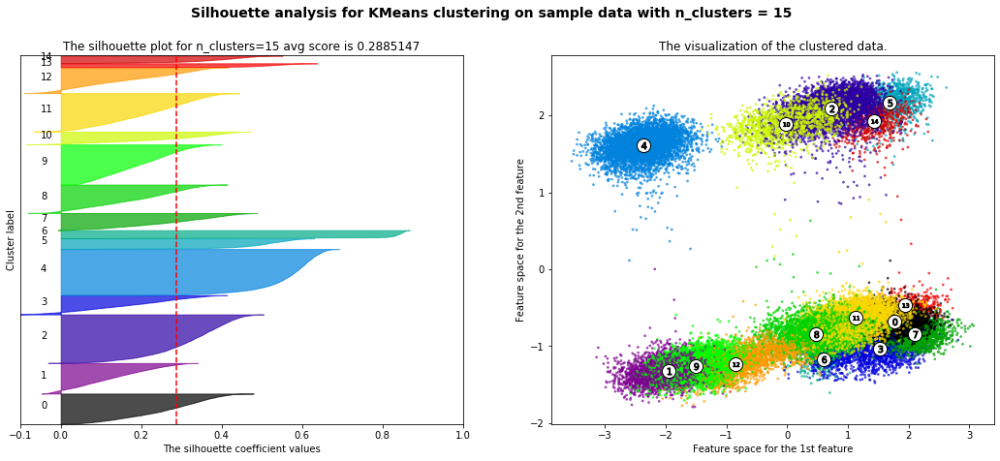

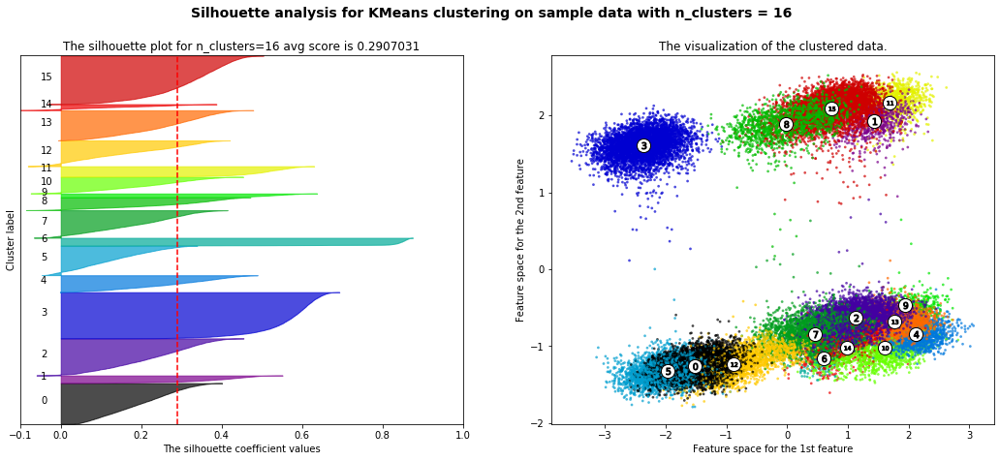

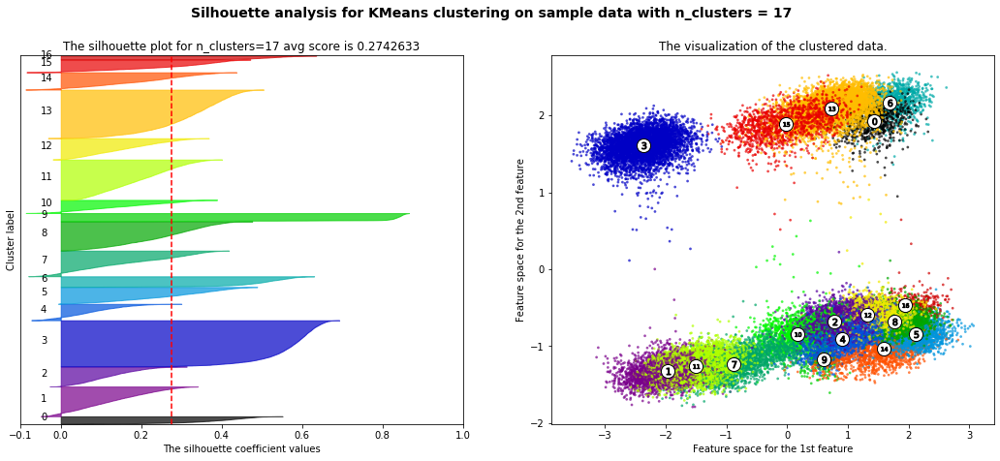

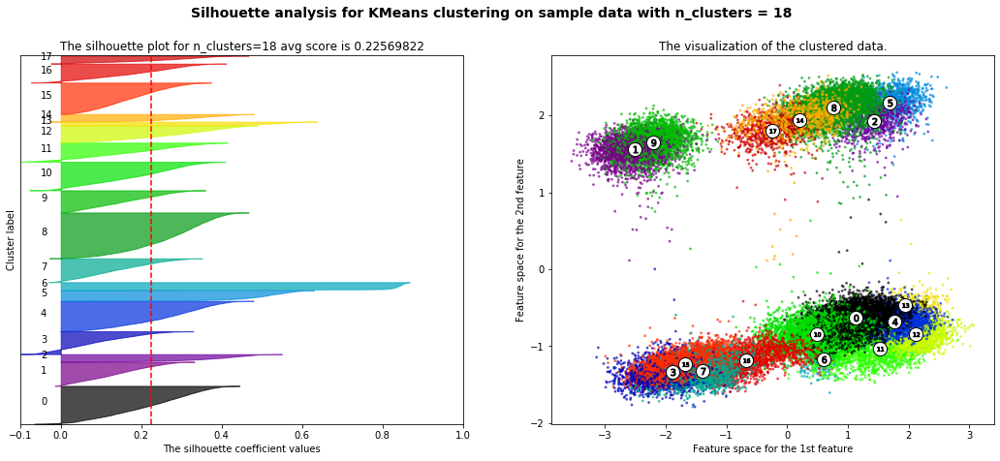

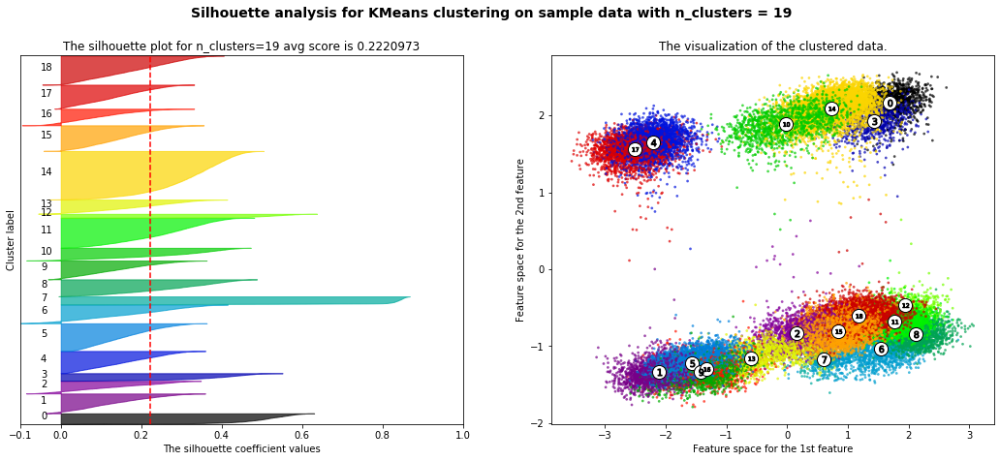

In [33]:
# Elbow method - code 1
sum_of_squared_distances = []
K = range(1,20)
avg_sils = []
opt_n_sil = 0
kms = []
for k in K:
    print("Clustering with k="+str(k))
    km = KMeans(n_clusters=k)
    kms.append(km)
    cluster_labels = km.fit_predict(X)
    # sum of squared distances for elbow analysis
    sum_of_squared_distances.append(km.inertia_)
    
    # silhouette score calculation
    if k > 1:
        avg_sil = plot_silhouette(k, cluster_labels, X, km.cluster_centers_)
        avg_sils.append(avg_sil)


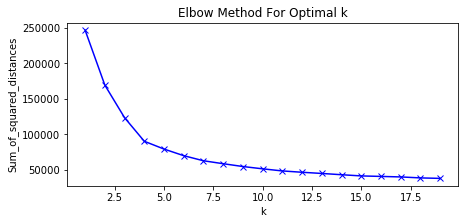

In [34]:
plt.rcParams["figure.figsize"] = (7,3)
plot_elbow(K, sum_of_squared_distances)

In [35]:
n_opt_elbow = optimal_number_of_clusters(sum_of_squared_distances)
n_opt_sil = avg_sils.index(max(avg_sils))+2
print("Optimal number of clusters with elbow: ",n_opt_elbow)
print("Optimal number of clusters with silhouette: ",n_opt_sil)

Optimal number of clusters with elbow:  12
Optimal number of clusters with silhouette:  4


In [36]:
# Choose the optimal number of clusters
optimal_choice = "elbow" # "elbow" or "silhouette" or "custom"
custom = 2 # adjust custom if you choose a cusom number

if optimal_choice == "elbow":
    n_opt = n_opt_elbow
elif optimal_choice == "silhouette":
    n_opt = n_opt_sil
else:
    n_opt = custom

print("Number of cluster chosen: "+str(n_opt))
km = kms[n_opt-1]

Number of cluster chosen: 12


In [37]:
# Find elements closest to the center
from sklearn.metrics import pairwise_distances_argmin

k_means_labels = pairwise_distances_argmin(km.cluster_centers_,X)
k_means_labels


array([26402,  9063, 37136, 15253, 16403, 21188,  6157, 19605,  6447,
       31009,   106,  2540])

### Extracting conformations

In [38]:
dt=date.today().strftime('%Y-%m-%d')+"-confs"

try:
    os.makedirs("./clusters/" + dt)
except OSError:
    print ("Creation of the directory %s failed" % dt)
else:
    print ("Successfully created the directory %s " % dt)

# Calculating the closest cluster element to each cluster center and returning [cluster number, element index]
closest = pairwise_distances_argmin(km.cluster_centers_,X)
#print(closest[2])

# kmeans input data "X" came from concatenated PCA data "X = np.concatenate([yi[:,:10] for yi in pca_y], axis=0)"
# thus frames were summed up (5 trajectories with 20001 frames each = 100005 frames/indexes)
results = []
for i in enumerate(closest):

    frameindex = i[1]
    results.append(frameindex)
    print("Closest conformation inside cluster " + str(i[0]) + " can be found in frame " + str(frameindex) + " of the sliced trajectory")
    
    # if you want to get the PDB file for this conformation, you can run this command in the command line:
    # mdconvert -t TOP_FILE_NAME.pdb -o OUTPUT_FILE_NAME.pdb -i PUT_FRAME_INDEX_HERE TRAJNAME_OF_TRAJINDEX.xtc
    # or if you want to stay in python:
    
    call(["mdconvert -t  " + top_file + " -o clusters/" + str(dt) + "/conf_PCA_in_cluster_"+str(i[0])+ ".pdb -i  " + str(frameindex) + " " + traj_file], shell=True)
results = np.array(results)

Successfully created the directory 2021-10-15-confs 
Closest conformation inside cluster 0 can be found in frame 26402 of the sliced trajectory
Closest conformation inside cluster 1 can be found in frame 9063 of the sliced trajectory
Closest conformation inside cluster 2 can be found in frame 37136 of the sliced trajectory
Closest conformation inside cluster 3 can be found in frame 15253 of the sliced trajectory
Closest conformation inside cluster 4 can be found in frame 16403 of the sliced trajectory
Closest conformation inside cluster 5 can be found in frame 21188 of the sliced trajectory
Closest conformation inside cluster 6 can be found in frame 6157 of the sliced trajectory
Closest conformation inside cluster 7 can be found in frame 19605 of the sliced trajectory
Closest conformation inside cluster 8 can be found in frame 6447 of the sliced trajectory
Closest conformation inside cluster 9 can be found in frame 31009 of the sliced trajectory
Closest conformation inside cluster 10 c

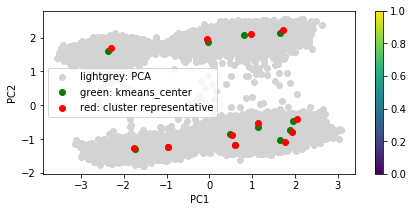

In [39]:
cc = km.cluster_centers_

#plotting all elements
plt.scatter(pca_y[0][:,0], pca_y[0][:,1], c="lightgrey")
plt.xlabel("PC1")
plt.ylabel("PC2")
#plt.legend(["r1", "r2", "r4"])

# plotting cluster centers
plt.scatter(cc[:, 0], cc[:, 1], c="green") 
plt.colorbar()

#plotting repesentative members
traj=0
for frame in results:
    plt.scatter(pca_y[traj][frame,0], pca_y[traj][frame,1], c="red")
    
plt.legend(["lightgrey: PCA", "green: kmeans_center", "red: cluster representative"])
plt.savefig("kmeans_repesent_9PCs.png")
plt.show()


## Tica analysis

In [40]:
# Compute tica timescales as a function of lag time - WARNING: may take a few hours
TICA_lagtimes = np.array([1,10,25,50,75,100,250,500,1000, 5000])
if os.path.exists("tica_timescales.npz"):
    f = np.load("tica_timescales.npz")
    lags = f["lags"]
    all_tica_timescales = list(f["timescales"])
else:
    all_tica_timescales = []
for l in TICA_lagtimes[len(all_tica_timescales):]:
    print("lag:",l)
    tica_obj_temp = pyemma.coordinates.tica(Y, lag=l, commute_map=True, kinetic_map=False, dim=50)
    tica_timescales = tica_obj_temp.timescales
    all_tica_timescales.append(tica_timescales)
np.savez_compressed("tica_timescales.npz", lags=TICA_lagtimes, timescales=all_tica_timescales)

lag: 1
lag: 10
lag: 25
lag: 50
lag: 75
lag: 100
lag: 250
lag: 500
lag: 1000
lag: 5000


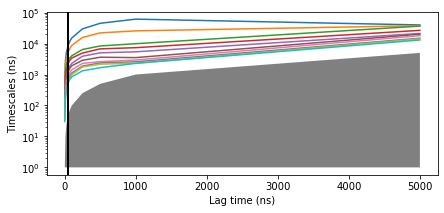

In [41]:
# Plot tica timescales as a function of lag time
lags = TICA_lagtimes
nlags = lags.shape[0]
ts_list = np.zeros((nlags, 10))
for i, lag in enumerate(lags):
    timescales = all_tica_timescales[i]
    ts_list[i, :] = timescales[:10]


plt.semilogy(lags, ts_list)
plt.ylabel('Timescales (ns)')
plt.xlabel('Lag time (ns)')
plt.fill_between(lags, 1, lags, facecolor='Gray')

plt.axvline(50, linewidth=2, color='black')
#plt.savefig('pics/tica_ts_over_lags.png', dpi=500)

In [42]:
# lag is in units of steps/frames, so you need to know the time per step/frame
tica_obj = pyemma.coordinates.tica(Y, lag=50) 
tica_y = tica_obj.get_output(dimensions=np.arange(50))

Z_concat = np.concatenate(tica_y, axis=0)
print(Z_concat.shape)

(37251, 50)


Total of 10.204728172872764% of variance explaned by first 5 ICs.


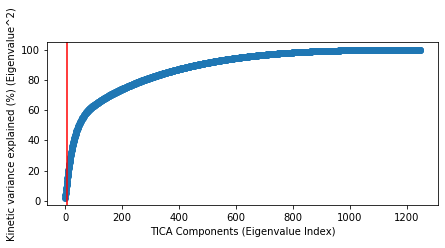

In [43]:
# take as much variance as you want explained
variance_explained = 10 

tica_eigenvalues = tica_obj.eigenvalues
variance = np.cumsum(tica_eigenvalues**2)/ np.sum(tica_eigenvalues**2)*100
tica_num = 0
for i, v in enumerate(variance):
    if v >= variance_explained:
        tica_num = i
        break
        
plt.scatter(np.arange(len(tica_eigenvalues)), variance)

plt.xlabel("TICA Components (Eigenvalue Index)")
plt.ylabel("Kinetic variance explained (%) (Eigenvalue^2)")
plt.savefig("tica_ev.png")
plt.axvline(tica_num, color='red')

print("Total of "+str(v)+"% of variance explaned by first "+str(tica_num)+" ICs.")

### Features with greatest contribution?

['RES_DIST (closest-heavy) GLN55 - VAL103'
 'RES_DIST (closest-heavy) GLN55 - SER28'
 'RES_DIST (closest-heavy) GLN55 - TYR103'
 'RES_DIST (closest-heavy) GLN55 - GLY29'
 'RES_DIST (closest-heavy) VAL51 - GLN55']
[630 632 653 633 462]
[0.83440438 0.83593016 0.83702959 0.84732118 0.85747184]
['RES_DIST (closest-heavy) GLN55 - VAL103'
 'RES_DIST (closest-heavy) GLN55 - SER28'
 'RES_DIST (closest-heavy) GLN55 - TYR103'
 'RES_DIST (closest-heavy) GLN55 - GLY29'
 'RES_DIST (closest-heavy) VAL51 - GLN55']
Corresponding influence of these features to the given PC
[0.83440438 0.83593016 0.83702959 0.84732118 0.85747184]


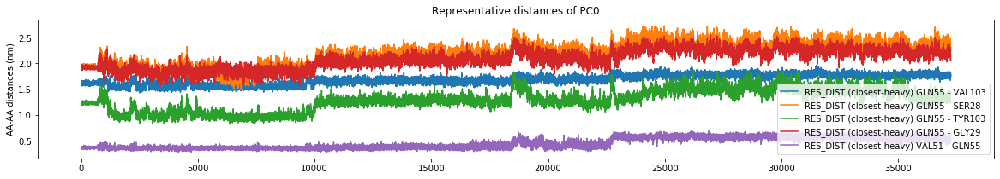

['RES_DIST (closest-heavy) TYR32 - PHE101'
 'RES_DIST (closest-heavy) GLU57 - PHE101'
 'RES_DIST (closest-heavy) GLU57 - PHE96'
 'RES_DIST (closest-heavy) GLU57 - MET98'
 'RES_DIST (closest-heavy) ARG52 - PHE101']
[391 699 717 719 514]
[0.58413219 0.59644197 0.61861122 0.61881703 0.73317884]
['RES_DIST (closest-heavy) TYR32 - PHE101'
 'RES_DIST (closest-heavy) GLU57 - PHE101'
 'RES_DIST (closest-heavy) GLU57 - PHE96'
 'RES_DIST (closest-heavy) GLU57 - MET98'
 'RES_DIST (closest-heavy) ARG52 - PHE101']
Corresponding influence of these features to the given PC
[0.58413219 0.59644197 0.61861122 0.61881703 0.73317884]


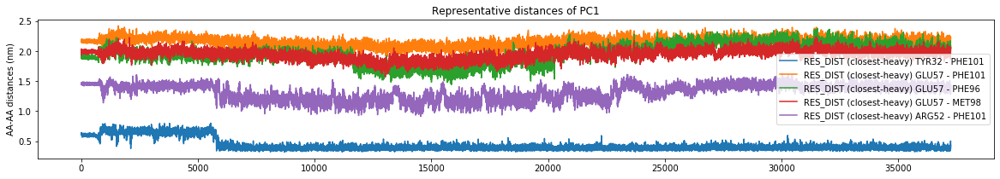

['RES_DIST (closest-heavy) GLY96 - GLY99'
 'RES_DIST (closest-heavy) ALA98 - VAL103'
 'RES_DIST (closest-heavy) ALA98 - VAL104' 'SIN(PHI 0 GLY 99)'
 'COS(PSI 0 ALA 98)']
[857 918 919  81  78]
[0.5716178  0.57322975 0.62859696 0.72446961 0.73210888]
['RES_DIST (closest-heavy) GLY96 - GLY99'
 'RES_DIST (closest-heavy) ALA98 - VAL103'
 'RES_DIST (closest-heavy) ALA98 - VAL104' 'SIN(PHI 0 GLY 99)'
 'COS(PSI 0 ALA 98)']
Corresponding influence of these features to the given PC
[0.5716178  0.57322975 0.62859696 0.72446961 0.73210888]


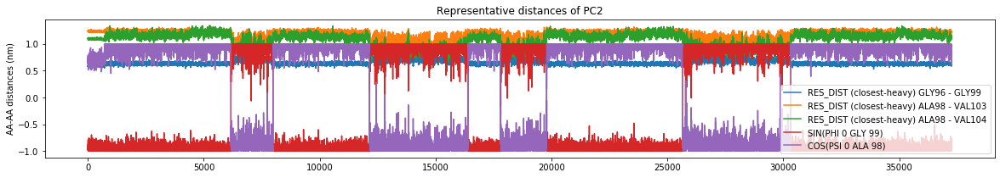

['RES_DIST (closest-heavy) PHE102 - PHE96'
 'RES_DIST (closest-heavy) PHE102 - TYR50'
 'RES_DIST (closest-heavy) PHE102 - THR54'
 'RES_DIST (closest-heavy) PHE102 - GLU53' 'SIN(PHI 1 SER 28)']
[1036 1027 1031 1030  105]
[0.48288277 0.48549423 0.49699496 0.50157681 0.52355195]
['RES_DIST (closest-heavy) PHE102 - PHE96'
 'RES_DIST (closest-heavy) PHE102 - TYR50'
 'RES_DIST (closest-heavy) PHE102 - THR54'
 'RES_DIST (closest-heavy) PHE102 - GLU53' 'SIN(PHI 1 SER 28)']
Corresponding influence of these features to the given PC
[0.48288277 0.48549423 0.49699496 0.50157681 0.52355195]


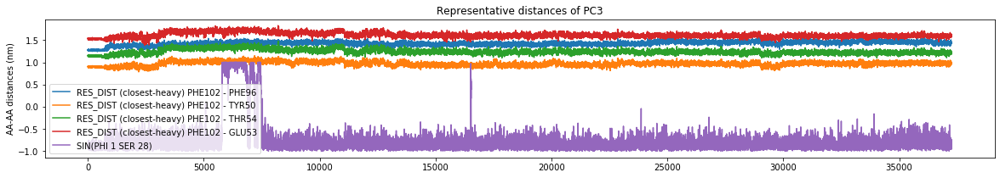

['RES_DIST (closest-heavy) SER52 - ASN97'
 'RES_DIST (closest-heavy) TYR54 - GLY96'
 'RES_DIST (closest-heavy) ILE31 - VAL104'
 'RES_DIST (closest-heavy) TYR54 - GLY97'
 'RES_DIST (closest-heavy) TYR54 - ALA98']
[1222  586  351  587  588]
[0.33408093 0.36753157 0.37913857 0.3805577  0.38858152]
['RES_DIST (closest-heavy) SER52 - ASN97'
 'RES_DIST (closest-heavy) TYR54 - GLY96'
 'RES_DIST (closest-heavy) ILE31 - VAL104'
 'RES_DIST (closest-heavy) TYR54 - GLY97'
 'RES_DIST (closest-heavy) TYR54 - ALA98']
Corresponding influence of these features to the given PC
[0.33408093 0.36753157 0.37913857 0.3805577  0.38858152]


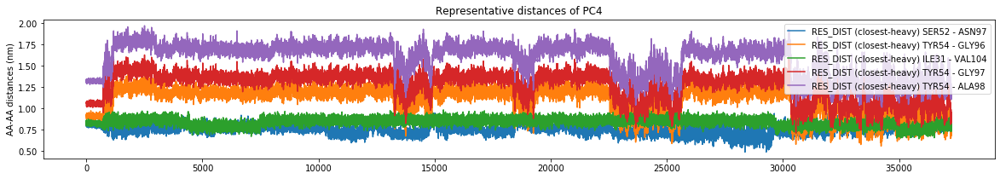

In [44]:

num_feats = 5
tica_corr = tica_obj.feature_TIC_correlation
plt.rcParams["figure.figsize"] = (20,3)
for i in range(5):
    TIC_i = abs(tica_corr)[:, i]
    sorted_ind_i = np.argsort(TIC_i)
    print(feat_des[sorted_ind_i][-num_feats:])
    print(sorted_ind_i[-num_feats:])
    print(TIC_i[sorted_ind_i][-num_feats:])
    print(feat_des[sorted_ind_i][-num_feats:])
    print("Corresponding influence of these features to the given PC")
    print(TIC_i[sorted_ind_i][-num_feats:])
    for j, elem in enumerate(sorted_ind_i[-num_feats:]):
        plt.plot(np.arange(len(Y)), Y[:,elem], label=feat_des[sorted_ind_i][-num_feats+j])
    
    plt.ylabel( "AA-AA distances (nm)")
    plt.title("Representative distances of PC"+str(i))
    plt.gca().legend()
    plt.show()

### Cluster with k-means over TICAs

In [45]:
Y_concat = np.concatenate(tica_y, axis=0)
print(Y_concat.shape)

X = np.concatenate([yi[:,:9] for yi in tica_y], axis=0)
print(X.shape)

(37251, 50)
(37251, 9)


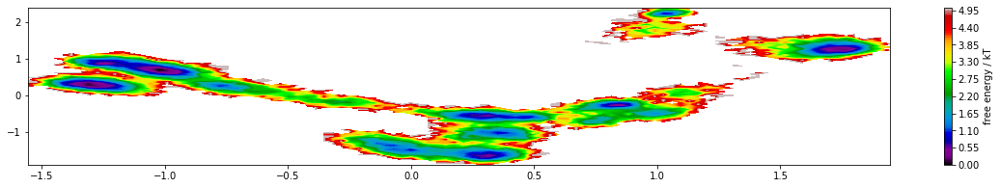

In [46]:
ret = pyemma.plots.plot_free_energy(Y_concat[:,0], Y_concat[:,1], cbar=True)

Clustering with k=1
Clustering with k=2
Clustering with k=3
Clustering with k=4
Clustering with k=5
Clustering with k=6
Clustering with k=7
Clustering with k=8
Clustering with k=9
Clustering with k=10
Clustering with k=11
Clustering with k=12
Clustering with k=13
Clustering with k=14
Clustering with k=15
Clustering with k=16
Clustering with k=17
Clustering with k=18
Clustering with k=19


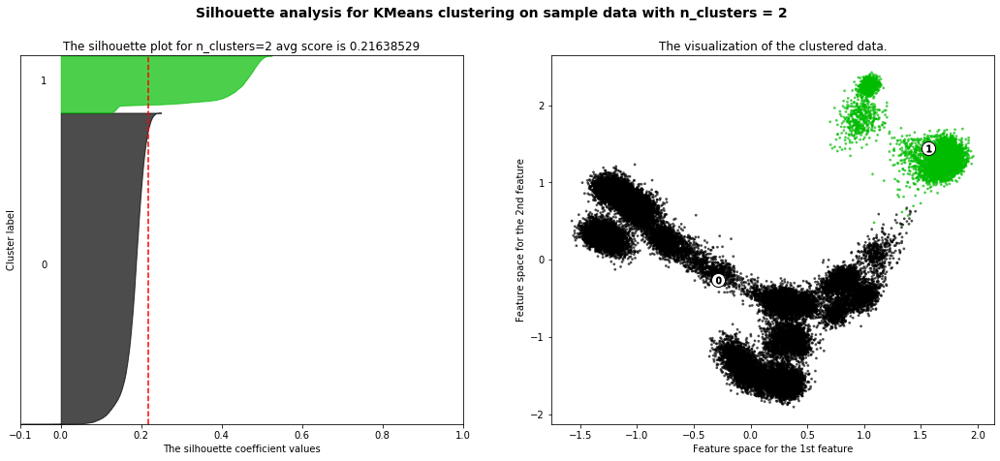

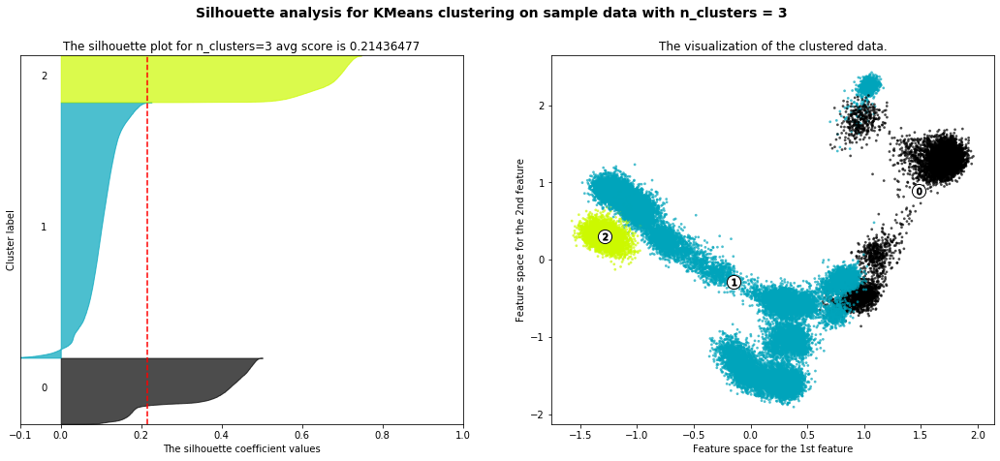

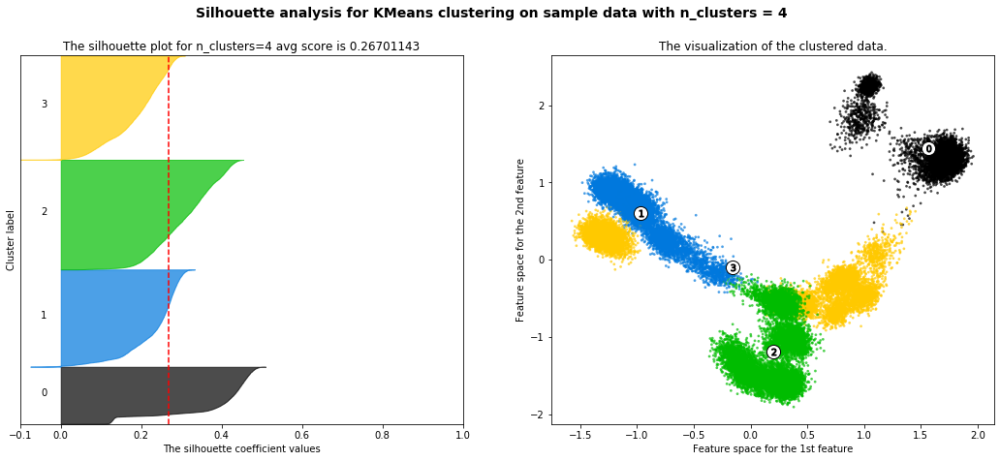

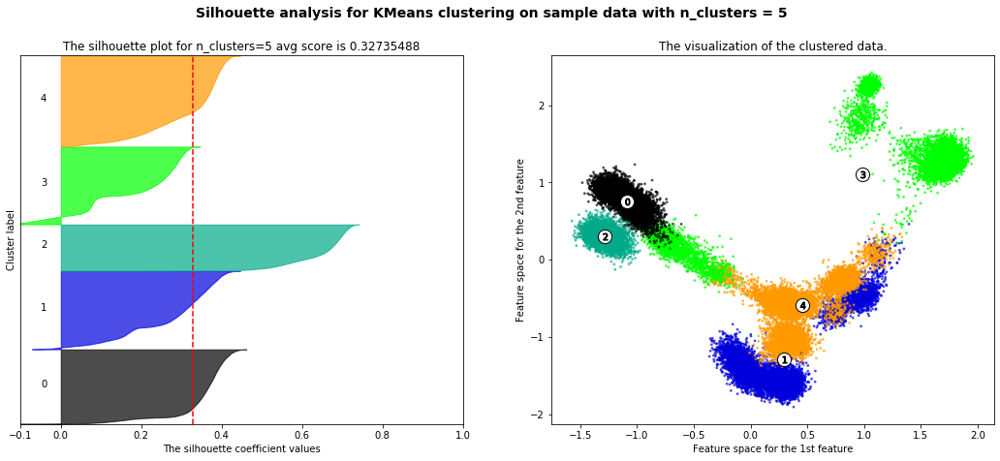

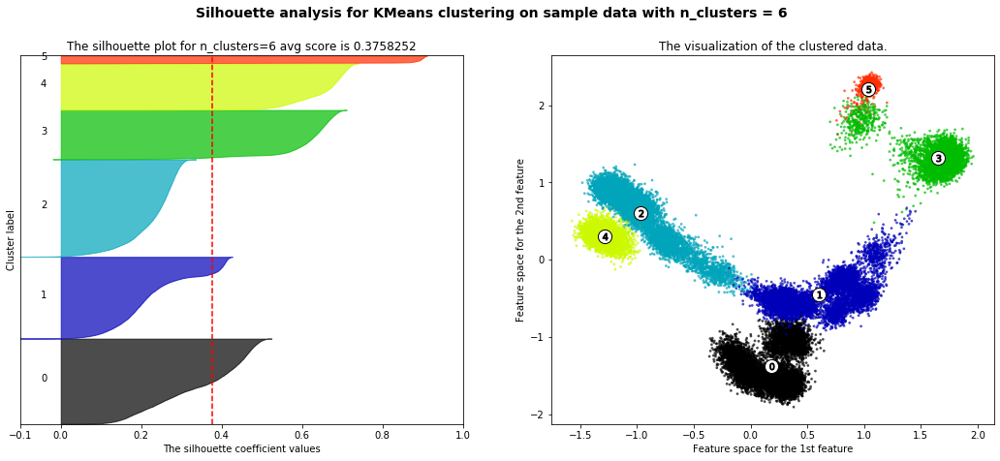

...

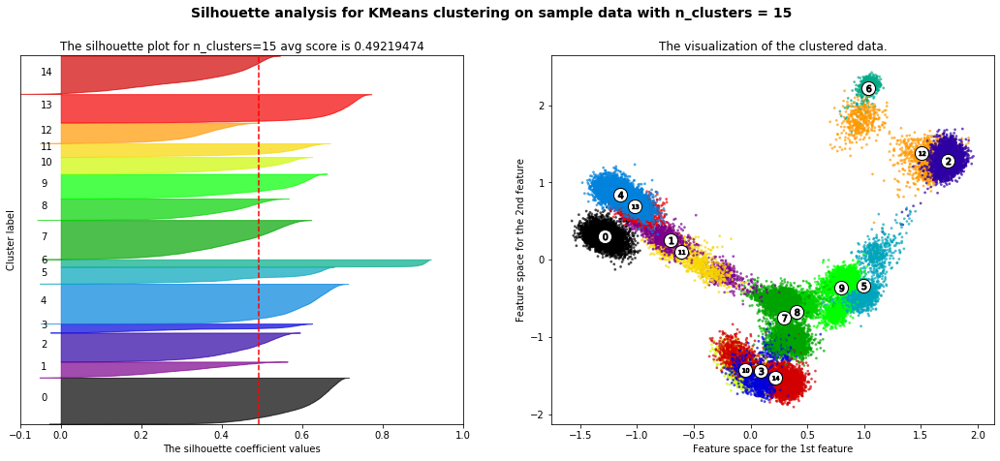

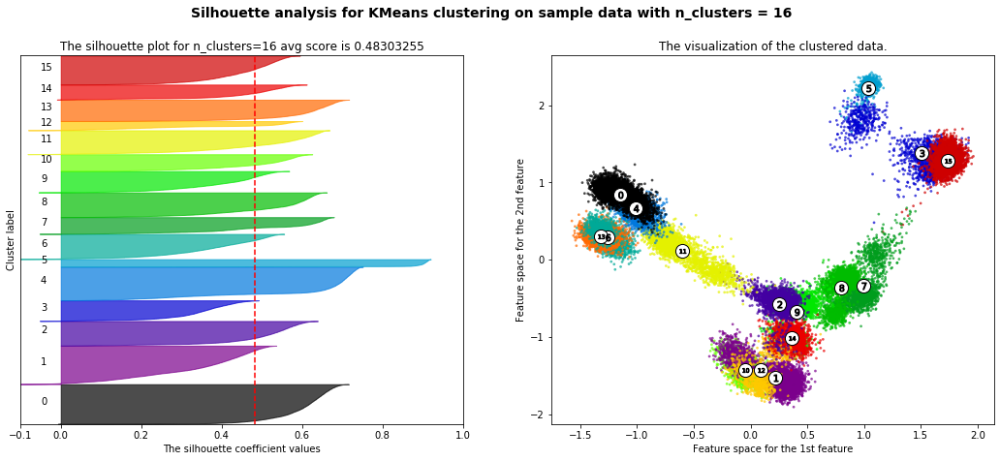

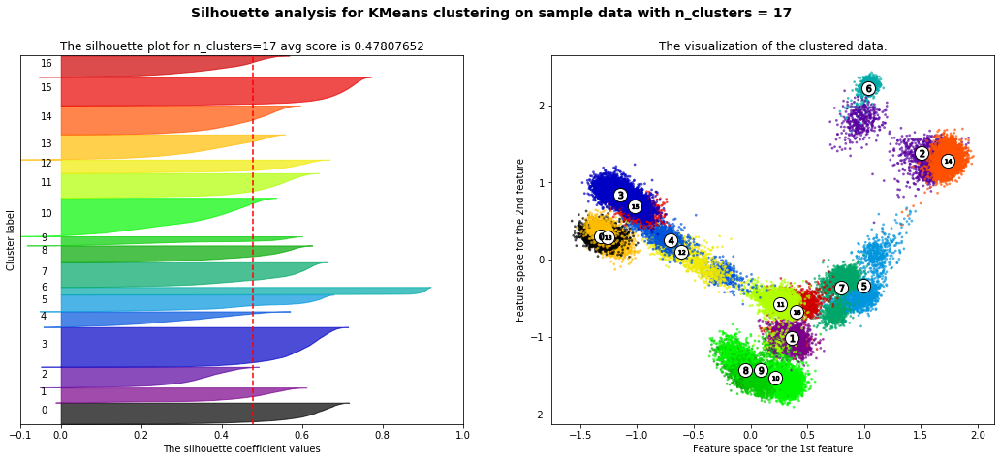

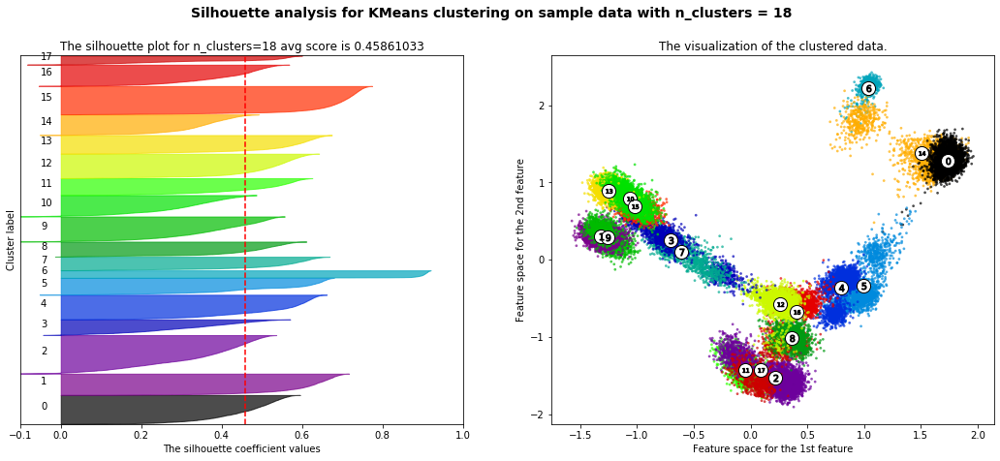

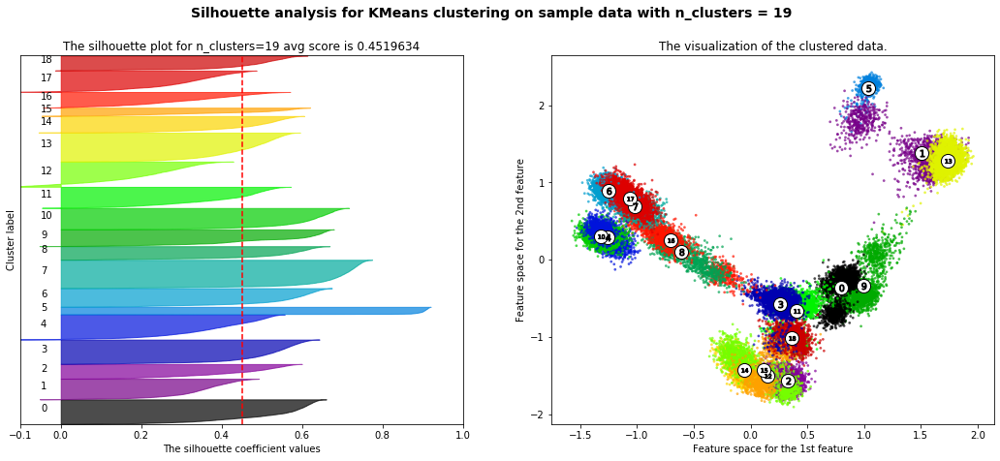

In [47]:
# Elbow method - code 1
sum_of_squared_distances = []
K = range(1,20)
avg_sils = []
opt_n_sil = 0
kms = []
for k in K:
    print("Clustering with k="+str(k))
    km = KMeans(n_clusters=k)
    kms.append(km)
    cluster_labels = km.fit_predict(X)
    # sum of squared distances for elbow analysis
    sum_of_squared_distances.append(km.inertia_)
    
    # silhouette score calculation
    if k > 1:
        avg_sil = plot_silhouette(k, cluster_labels, X, km.cluster_centers_)
        avg_sils.append(avg_sil)


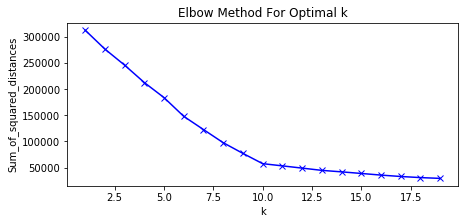

In [48]:
plt.rcParams["figure.figsize"] = (7,3)
plot_elbow(K, sum_of_squared_distances)

In [49]:
n_opt_elbow = optimal_number_of_clusters(sum_of_squared_distances)
n_opt_sil = avg_sils.index(max(avg_sils))+2
print("Optimal number of clusters with elbow: ",n_opt_elbow)
print("Optimal number of clusters with silhouette: ",n_opt_sil)

Optimal number of clusters with elbow:  17
Optimal number of clusters with silhouette:  10


In [50]:
n_opt_elbow = optimal_number_of_clusters(sum_of_squared_distances)
n_opt_sil = avg_sils.index(max(avg_sils))+2
print("Optimal number of clusters with elbow: ",n_opt_elbow)
print("Optimal number of clusters with silhouette: ",n_opt_sil)

Optimal number of clusters with elbow:  17
Optimal number of clusters with silhouette:  10


In [51]:
# Choose the optimal number of clusters
optimal_choice = "elbow" # "elbow" or "silhouette" or "custom"
custom = 2 # adjust custom if you choose a cusom number

if optimal_choice == "elbow":
    n_opt = n_opt_elbow
elif optimal_choice == "silhouette":
    n_opt = n_opt_sil
else:
    n_opt = custom

print("Number of cluster chosen: "+str(n_opt))
km = kms[n_opt-1]

Number of cluster chosen: 17


### Extract conformations

In [68]:
from subprocess import call
dt=date.today().strftime('%Y-%m-%d')+"-confs"

try:
    os.makedirs("tica/" + dt)
except OSError:
    print ("Creation of the directory %s failed" % dt)
else:
    print ("Successfully created the directory %s " % dt)

results = []
closest = pairwise_distances_argmin(km.cluster_centers_,X)

for i in enumerate(closest): # index_clusters is a list, where each element is a list of conformations

    frameindex = i[1]
    
    results.append([frameindex])
    # since there was only one trajectory, trajindex will always be zero
    # if there are more trajectories, then they will be denoted by trajindex=0,1,2,...
    print("Closest conformation inside cluster " + str(i) + " frame " + str(frameindex) + " of the striped trajectory")
    call(["mdconvert -t " + top_file + " -o tica/" + str(dt) + "/conf_in_cluster_" + str(i[0]) + ".pdb -i " + str(frameindex) + " " + traj_file], shell=True)

results = np.array(results)

Creation of the directory 2021-10-15-confs failed
Closest conformation inside cluster (0, 27859) frame 27859 of the striped trajectory
Closest conformation inside cluster (1, 16607) frame 16607 of the striped trajectory
Closest conformation inside cluster (2, 1304) frame 1304 of the striped trajectory
Closest conformation inside cluster (3, 34735) frame 34735 of the striped trajectory
Closest conformation inside cluster (4, 24883) frame 24883 of the striped trajectory
Closest conformation inside cluster (5, 7414) frame 7414 of the striped trajectory
Closest conformation inside cluster (6, 213) frame 213 of the striped trajectory
Closest conformation inside cluster (7, 8512) frame 8512 of the striped trajectory
Closest conformation inside cluster (8, 13331) frame 13331 of the striped trajectory
Closest conformation inside cluster (9, 19761) frame 19761 of the striped trajectory
Closest conformation inside cluster (10, 14962) frame 14962 of the striped trajectory
Closest conformation ins

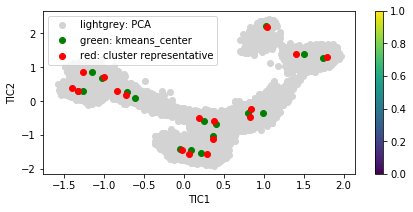

In [69]:
# Supperimpose plots

cc = km.cluster_centers_

#plotting all elements
plt.scatter(tica_y[0][:,0], tica_y[0][:,1], c="lightgrey")
plt.xlabel("TIC1")
plt.ylabel("TIC2")
#plt.legend(["r1", "r2", "r4"])

# plotting cluster centers
plt.scatter(cc[:, 0], cc[:, 1], c="green") 
plt.colorbar()

#plotting repesentative members
for frame in results:
    plt.scatter(tica_y[traj][frame,0], tica_y[traj][frame,1], c="red")
    
plt.legend(["lightgrey: PCA", "green: kmeans_center", "red: cluster representative"])
plt.savefig("kmeans_repesent_TICs.png")
plt.show()
